In [2]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Tuple
from PIL import Image

# ----------------------------
# Disjoint Set Union (Union-Find)
# ----------------------------
class DSU:
    def __init__(self, n):
        self.parent = np.arange(n, dtype=np.int32)
        self.size = np.ones(n, dtype=np.int32)
        # Internal difference (Int(C)): max edge weight in the component's MST so far
        self.int_diff = np.zeros(n, dtype=np.float32)

    def find(self, x):
        # Path compression
        while self.parent[x] != x:
            self.parent[x] = self.parent[self.parent[x]]
            x = self.parent[x]
        return x

    def union(self, a, b, w):
        ra, rb = self.find(a), self.find(b)
        if ra == rb:
            return ra
        # Union by size
        if self.size[ra] < self.size[rb]:
            ra, rb = rb, ra
        self.parent[rb] = ra
        self.size[ra] += self.size[rb]
        # Update internal difference for the merged component:
        # max of the two components' Int plus the weight of the connecting edge
        self.int_diff[ra] = max(self.int_diff[ra], self.int_diff[rb], w)
        return ra

# ----------------------------
# Helper functions
# ----------------------------
def to_float_image(img: np.ndarray) -> np.ndarray:
    img = img.astype(np.float32)
    if img.ndim == 2:
        img = img[..., None]  # HxW -> HxWx1
    return img

def build_edges(img: np.ndarray) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """
    Build 8-neighborhood edges for an HxWxC image.
    Returns (u, v, w): arrays of indices (flattened) and weights.
    """
    H, W, C = img.shape
    idx = np.arange(H * W, dtype=np.int32).reshape(H, W)

    # Neighbor offsets for 8-neighborhood
    neighbors = [(0,1), (1,0), (1,1), (-1,1)]  # directed set to avoid duplicates
    edges_u = []
    edges_v = []
    edges_w = []

    flat = img.reshape(-1, C)

    for dy, dx in neighbors:
        y0 = max(0, -dy)
        y1 = min(H, H - dy)
        x0 = max(0, -dx)
        x1 = min(W, W - dx)
        p = idx[y0:y1, x0:x1].ravel()
        q = idx[y0+dy:y1+dy, x0+dx:x1+dx].ravel()
        a = flat[p]
        b = flat[q]
        # Euclidean distance in feature space
        w = np.linalg.norm(a - b, axis=1)
        edges_u.append(p)
        edges_v.append(q)
        edges_w.append(w.astype(np.float32))

    u = np.concatenate(edges_u)
    v = np.concatenate(edges_v)
    w = np.concatenate(edges_w)
    return u, v, w

def felzenszwalb_segment(img: np.ndarray, k: float = 300.0, min_size: int = 20) -> np.ndarray:
    """
    Perform FH (2004) segmentation.
    Args:
        img: HxW[xC] uint8/float32 image.
        k: scale parameter controlling preference for larger components.
        min_size: post-process to remove components smaller than this by
                  merging with the most similar neighbor.
    Returns:
        labels: HxW int32 array of component labels [0..num_components-1].
    """
    img = to_float_image(img)
    H, W, C = img.shape
    N = H * W

    # Build graph
    u, v, w = build_edges(img)

    # Sort edges by weight ascending
    order = np.argsort(w)
    u, v, w = u[order], v[order], w[order]

    # Init DSU
    dsu = DSU(N)

    # Threshold function tau(C) = k / |C|
    def threshold(root):
        return k / dsu.size[root]

    # Main pass: process edges in order
    for uu, vv, ww in zip(u, v, w):
        ra = dsu.find(uu)
        rb = dsu.find(vv)
        if ra == rb:
            continue
        m_int = min(dsu.int_diff[ra] + threshold(ra),
                    dsu.int_diff[rb] + threshold(rb))
        if ww <= m_int:
            dsu.union(ra, rb, ww)

    # Post-processing: merge very small components
    for uu, vv, ww in zip(u, v, w):
        ra = dsu.find(uu)
        rb = dsu.find(vv)
        if ra != rb:
            if dsu.size[ra] < min_size:
                dsu.union(ra, rb, ww)
            elif dsu.size[rb] < min_size:
                dsu.union(rb, ra, ww)

    # Flatten labels
    roots = np.array([dsu.find(i) for i in range(N)], dtype=np.int32)
    unique_roots, labels = np.unique(roots, return_inverse=True)
    return labels.reshape(H, W).astype(np.int32)

def random_label_colors(labels: np.ndarray, seed: int = 0) -> np.ndarray:
    rng = np.random.default_rng(seed)
    h, w = labels.shape
    k = labels.max() + 1
    palette = rng.integers(0, 255, size=(k, 3), dtype=np.uint8)
    return palette[labels]


In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
from typing import Dict, Tuple, List

# ---------- Feature maps (OpenCV) ----------
def _prep_feature_maps(img_rgb: np.ndarray, use_texture: bool):
    """
    Precompute HSV and (optional) gradient magnitude once.
    Returns hsv[u8] and gmag[float32 or None]
    """
    if img_rgb.dtype != np.uint8:
        base = np.clip(img_rgb, 0, 255).astype(np.uint8)
    else:
        base = img_rgb

    hsv = cv2.cvtColor(base, cv2.COLOR_RGB2HSV)

    gmag = None
    if use_texture:
        gray = cv2.cvtColor(base, cv2.COLOR_RGB2GRAY)
        gx = cv2.Sobel(gray, cv2.CV_32F, 1, 0, ksize=3)
        gy = cv2.Sobel(gray, cv2.CV_32F, 0, 1, ksize=3)
        gmag = cv2.magnitude(gx, gy)  # sqrt(gx^2 + gy^2)
    return hsv, gmag

# ---------- Region bookkeeping ----------
class Region:
    __slots__ = ("id", "pixels", "area", "bbox", "hist", "t_hist", "neighbors")
    def __init__(self, rid: int, pixels: Tuple[np.ndarray, np.ndarray]):
        self.id = rid
        self.pixels = pixels     # (ys, xs) arrays
        self.area = pixels[0].size
        x1, y1, x2, y2 = (pixels[1].min(), pixels[0].min(),
                          pixels[1].max()+1, pixels[0].max()+1)
        self.bbox = (int(x1), int(y1), int(x2), int(y2))
        self.hist = None         # color hist (normalized)
        self.t_hist = None       # texture hist (normalized)
        self.neighbors = set()

def _hist_intersection(h1: np.ndarray, h2: np.ndarray) -> float:
    return float(np.minimum(h1, h2).sum())

def _compute_region_stats(
    img_rgb: np.ndarray,
    labels: np.ndarray,
    use_texture: bool = True,
    color_bins: Tuple[int,int,int] = (25,25,25),
    tex_bins: int = 10
) -> Tuple[Dict[int,Region], int, int, np.ndarray, np.ndarray]:
    """
    Build Region objects with HSV & (optional) texture histograms + adjacency.
    """
    H, W = labels.shape
    hsv, gmag = _prep_feature_maps(img_rgb, use_texture)

    # 1) init regions with pixel lists
    regions: Dict[int,Region] = {}
    for rid in np.unique(labels):
        ys, xs = np.where(labels == rid)
        regions[int(rid)] = Region(int(rid), (ys, xs))

    # 2) color hist per region (HSV; density=True then re-norm to be safe)
    edges_256 = (0, 256)
    for rid, R in regions.items():
        ys, xs = R.pixels
        Hc = hsv[ys, xs, 0]; Sc = hsv[ys, xs, 1]; Vc = hsv[ys, xs, 2]
        h_hist, _ = np.histogram(Hc, bins=color_bins[0], range=edges_256, density=True)
        s_hist, _ = np.histogram(Sc, bins=color_bins[1], range=edges_256, density=True)
        v_hist, _ = np.histogram(Vc, bins=color_bins[2], range=edges_256, density=True)
        hist = np.concatenate([h_hist, s_hist, v_hist]).astype(np.float32)
        hist = hist / (hist.sum() + 1e-9)
        R.hist = hist

    # 3) texture hist per region (gradient magnitude)
    if use_texture:
        lo, hi = (float(gmag.min()), float(gmag.max()) + 1e-6)
        t_edges = np.linspace(lo, hi, tex_bins+1, dtype=np.float32)
        for rid, R in regions.items():
            vals = gmag[R.pixels]
            t_hist, _ = np.histogram(vals, bins=t_edges, density=True)
            t_hist = t_hist.astype(np.float32)
            t_hist = t_hist / (t_hist.sum() + 1e-9)
            R.t_hist = t_hist

    # 4) region adjacency (4-neighborhood scan on label grid)
    nbrs = defaultdict(set)
    for y in range(H):
        for x in range(W-1):
            a, b = int(labels[y, x]), int(labels[y, x+1])
            if a != b: nbrs[a].add(b); nbrs[b].add(a)
    for y in range(H-1):
        for x in range(W):
            a, b = int(labels[y, x]), int(labels[y+1, x])
            if a != b: nbrs[a].add(b); nbrs[b].add(a)
    for rid, R in regions.items():
        R.neighbors = nbrs[rid]

    return regions, H, W, hsv, gmag

def _merge_regions(Ra: Region, Rb: Region, new_id: int, use_texture: bool) -> Region:
    ys = np.concatenate([Ra.pixels[0], Rb.pixels[0]])
    xs = np.concatenate([Ra.pixels[1], Rb.pixels[1]])
    Rc = Region(new_id, (ys, xs))
    # merged bbox
    a, b = Ra.bbox, Rb.bbox
    Rc.bbox = (min(a[0], b[0]), min(a[1], b[1]), max(a[2], b[2]), max(a[3], b[3]))
    # merged hists (area-weighted by summation, then renormalize)
    Rc.hist = (Ra.hist + Rb.hist); Rc.hist /= (Rc.hist.sum() + 1e-9)
    if use_texture:
        Rc.t_hist = (Ra.t_hist + Rb.t_hist); Rc.t_hist /= (Rc.t_hist.sum() + 1e-9)
    # neighbors: union minus the pair ids
    Rc.neighbors = (Ra.neighbors | Rb.neighbors) - {Ra.id, Rb.id}
    return Rc

# ---------- Similarity (Uijlings et al.) ----------
def _similarity(Ra: Region, Rb: Region, img_area: int,
                use_texture: bool,
                w_color=1.0, w_texture=0.5, w_size=0.5, w_fill=0.5) -> float:
    s_color = _hist_intersection(Ra.hist, Rb.hist)
    s_tex = _hist_intersection(Ra.t_hist, Rb.t_hist) if use_texture else 0.0
    # size prior (favor merging small regions)
    s_size = 1.0 - (Ra.area + Rb.area) / float(img_area)
    # fill prior (how well they fit the tight bbox)
    x1 = min(Ra.bbox[0], Rb.bbox[0]); y1 = min(Ra.bbox[1], Rb.bbox[1])
    x2 = max(Ra.bbox[2], Rb.bbox[2]); y2 = max(Ra.bbox[3], Rb.bbox[3])
    bb_area = float(max(0, x2 - x1) * max(0, y2 - y1))
    s_fill = 1.0 - (bb_area - Ra.area - Rb.area) / float(img_area + 1e-9)
    return (w_color * s_color + w_texture * s_tex + w_size * s_size + w_fill * s_fill)

# ---------- Heap helpers ----------
import heapq
def _push_pair(heap, regions: Dict[int,Region], a: int, b: int, img_area: int, use_texture: bool):
    if a == b: return
    Ra, Rb = regions.get(a), regions.get(b)
    if (Ra is None) or (Rb is None): return
    s = _similarity(Ra, Rb, img_area, use_texture)
    # max-heap via negative score; store sorted ids to avoid duplicates
    a2, b2 = (a, b) if a < b else (b, a)
    heapq.heappush(heap, (-float(s), a2, b2))

# ---------- Snapshotted merging loop ----------
def selective_search_snapshots(
    img_rgb: np.ndarray,
    k: float = 300.0,
    min_size: int = 50,
    use_texture: bool = True,
    snapshots: int = 20,
    grid: Tuple[int,int] = (5,4),
    seed_for_colors: int = 123
):
    """
    1) Initial FH segmentation (felzenszwalb_segment).
    2) Build RAG + region stats.
    3) Greedy merging by similarity, taking ~snapshots evenly spaced in time.
    4) Render a grid of colored segmentations titled 'Iteration X'.
    """
    # Step 1: superpixels (FH implementation)
    labels0 = felzenszwalb_segment(img_rgb, k=float(k), min_size=min_size)
    regions, H, W, _, _ = _compute_region_stats(img_rgb, labels0, use_texture=use_texture)
    img_area = H * W

    # Build initial heap of neighbor pairs
    heap = []
    for rid, R in regions.items():
        for n in R.neighbors:
            if rid < n:
                _push_pair(heap, regions, rid, n, img_area, use_texture)

    # Determine iteration indices to snapshot
    total_merges = max(0, len(regions) - 1)
    if total_merges == 0:
        snaps = [0]
    else:
        snaps = np.unique(np.linspace(1, total_merges, num=snapshots, dtype=int)).tolist()

    snap_imgs: List[Tuple[int, np.ndarray]] = []
    new_id = int(labels0.max()) + 1
    merges_done = 0

    # Helper: build a labels array from current region pixel lists (only when needed)
    def _labels_from_regions() -> np.ndarray:
        lab = np.full((H, W), -1, dtype=np.int32)
        # map current region ids to dense [0..K-1] for coloring stability
        cur_ids = list(regions.keys())
        id_map = {rid: i for i, rid in enumerate(cur_ids)}
        for rid, R in regions.items():
            lab[R.pixels] = id_map[rid]
        return lab

    while heap and (len(regions) > 1):
        neg_s, a, b = heapq.heappop(heap)
        # skip stale pairs
        if (a not in regions) or (b not in regions):
            continue
        # also ensure they are still neighbors
        if b not in regions[a].neighbors:
            continue

        # Merge the pair
        Ra, Rb = regions[a], regions[b]
        Rc = _merge_regions(Ra, Rb, new_id, use_texture=use_texture)
        # remove a,b; add new
        del regions[a]; del regions[b]
        regions[new_id] = Rc
        merges_done += 1
        cur_new = new_id
        new_id += 1

        # Update neighbors: redirect neighbor sets from a/b to new region
        for n in list(Rc.neighbors):
            if n in regions:
                # fix neighbor's set: drop a/b, add new
                regions[n].neighbors.discard(a)
                regions[n].neighbors.discard(b)
                regions[n].neighbors.add(cur_new)
                # push new pair
                _push_pair(heap, regions, cur_new, n, img_area, use_texture)

        # Snapshot if this iteration matches one of the targets
        if merges_done in snaps:
            lab = _labels_from_regions()
            vis = random_label_colors(lab, seed=seed_for_colors + merges_done)
            # early exit if we already captured enough
            if len(snap_imgs) >= len(snaps):
                break

    # Plot grid (5x4 default)
    rows, cols = grid
    plt.figure(figsize=(3.2*cols, 2.6*rows))
    for i, (it, vis) in enumerate(snap_imgs[:rows*cols]):
        plt.subplot(rows, cols, i+1)
        plt.imshow(vis)
        plt.title(f"Iteration {it}", fontsize=10)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

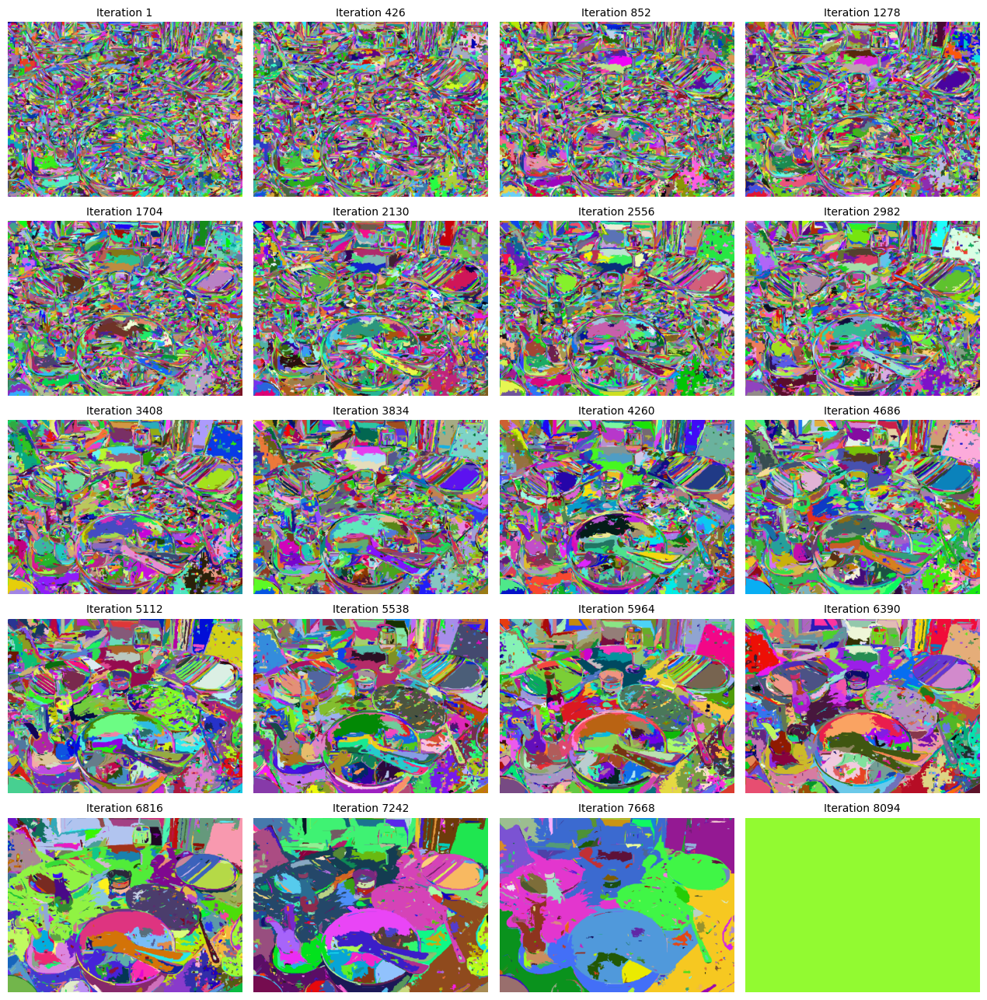

In [5]:
from PIL import Image
img = np.array(Image.open("table_sample.png").convert("RGB"))

# 20 snapshots shown as a 5x4 grid, taken evenly from start→end of merging.
selective_search_snapshots(
    img_rgb=img,
    k=50.0,            # FH scale; try 50/100/150/300
    min_size=50,
    use_texture=True,   # include simple texture cue (grad magnitude)
    snapshots=20,
    grid=(5,4)
)

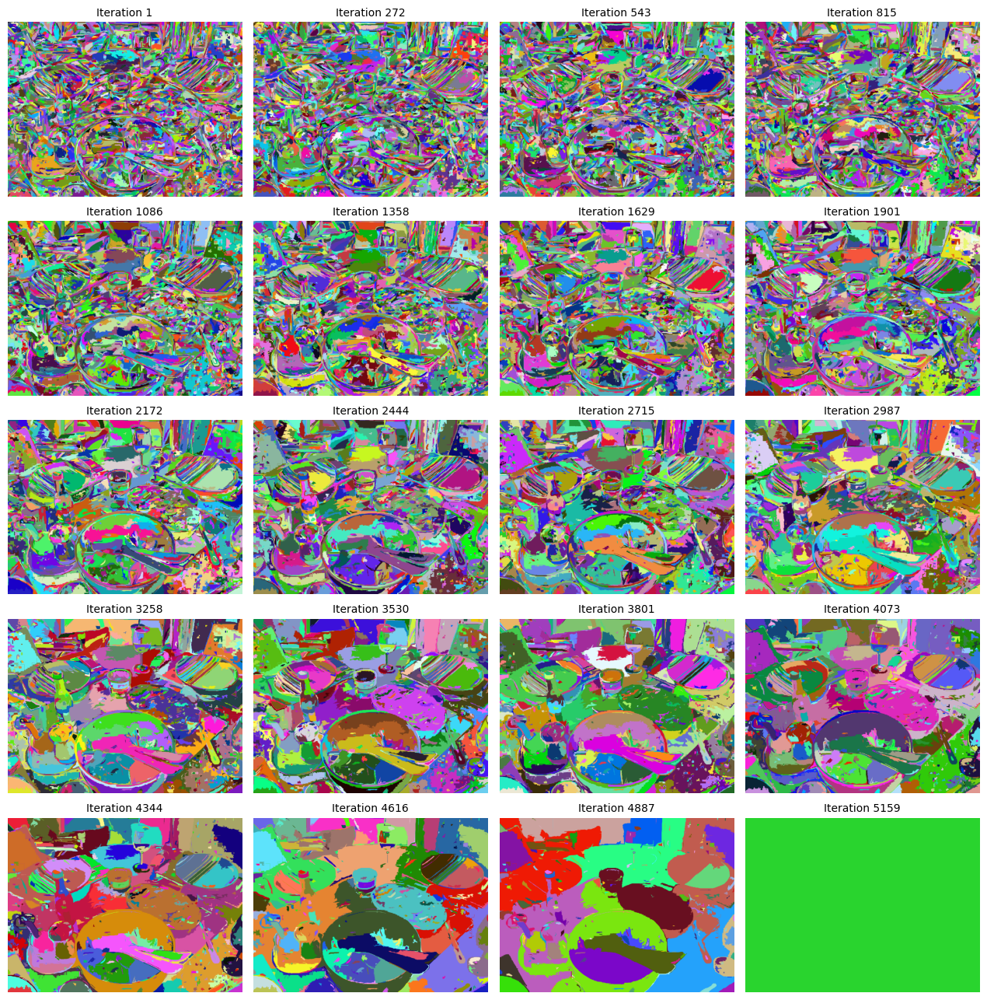

In [6]:
selective_search_snapshots(
    img_rgb=img,
    k=100.0,            # FH scale; try 50/100/150/300
    min_size=50,
    use_texture=True,   # include simple texture cue (grad magnitude)
    snapshots=20,
    grid=(5,4)
)

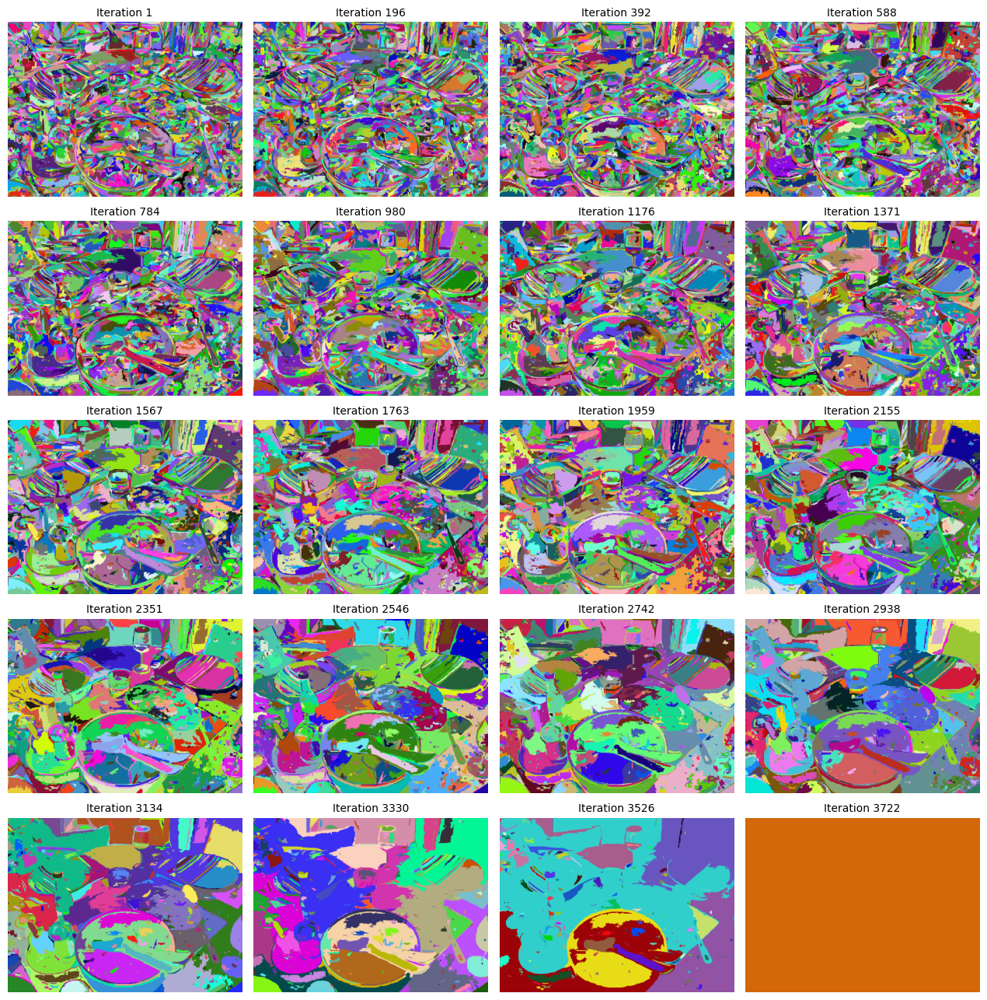

In [7]:
selective_search_snapshots(
    img_rgb=img,
    k=150.0,            # FH scale; try 50/100/150/300
    min_size=50,
    use_texture=True,   # include simple texture cue (grad magnitude)
    snapshots=20,
    grid=(5,4)
)

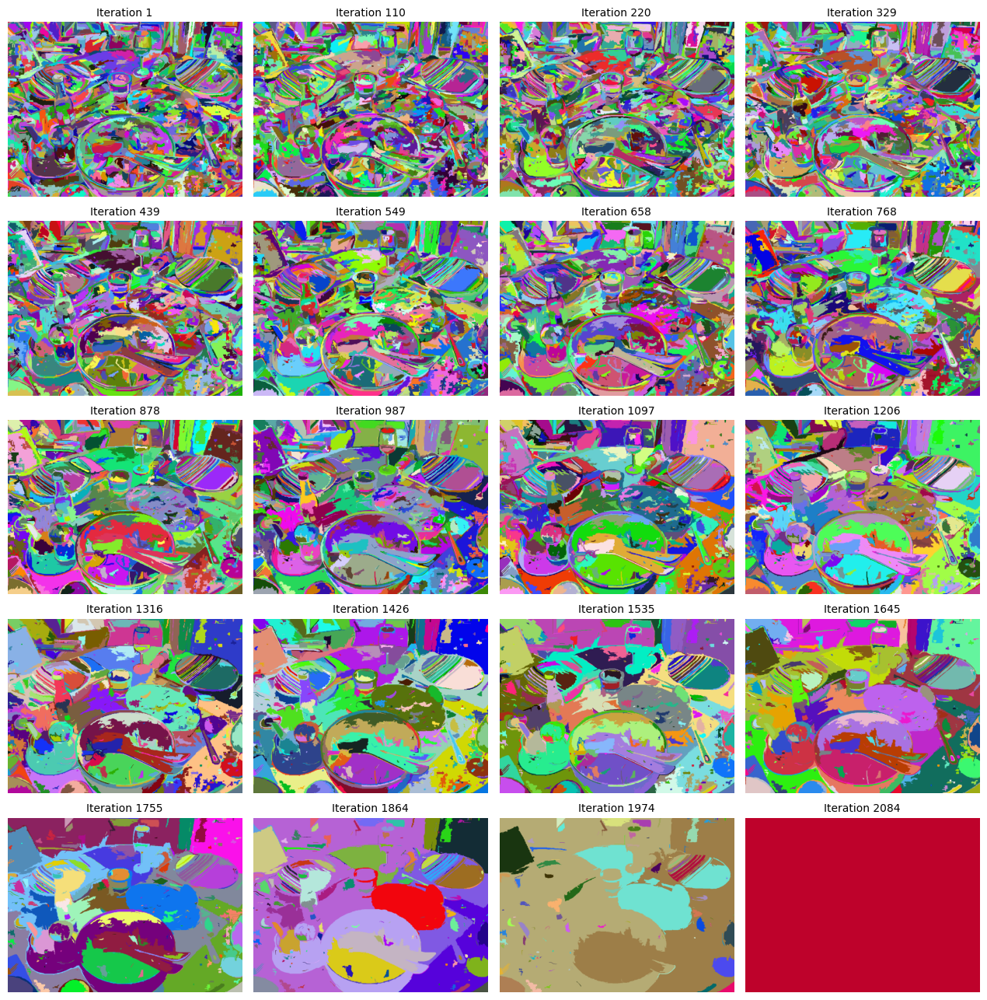

In [8]:
selective_search_snapshots(
    img_rgb=img,
    k=300.0,            # FH scale; try 50/100/150/300
    min_size=50,
    use_texture=True,   # include simple texture cue (grad magnitude)
    snapshots=20,
    grid=(5,4)
)

In [9]:
# ----------------------------
# IoU + NMS helpers (if you don't have them yet)
# ----------------------------
def _iou_xyxy(a, b):
    ax1, ay1, ax2, ay2 = a
    bx1, by1, bx2, by2 = b
    ix1, iy1 = max(ax1, bx1), max(ay1, by1)
    ix2, iy2 = min(ax2, bx2), min(ay2, by2)
    iw, ih = max(0, ix2 - ix1), max(0, iy2 - iy1)
    inter = iw * ih
    ua = (ax2 - ax1) * (ay2 - ay1) + (bx2 - bx1) * (by2 - by1) - inter + 1e-9
    return inter / ua

def _nms_keep(boxes, iou_thr=0.7):
    if not boxes:
        return []
    boxes = np.asarray(boxes, dtype=float)
    areas = (boxes[:,2]-boxes[:,0]) * (boxes[:,3]-boxes[:,1])
    order = np.argsort(areas)[::-1]  # large first (keeps diverse, fewer duplicates)
    keep = []
    while order.size:
        i = order[0]
        keep.append(i)
        rest = order[1:]
        ious = np.array([_iou_xyxy(boxes[i], boxes[j]) for j in rest])
        order = rest[ious < iou_thr]
    return [tuple(map(int, boxes[i])) for i in keep]

# ----------------------------
# One-scale proposal harvest
# ----------------------------
def _proposals_one_scale(
    img_rgb,
    k=300.0,
    min_size=50,
    use_texture=True,
    max_merges=None,           # None = run full
    include_initial=True       # also include bboxes of initial FH regions
):
    """
    Runs FH -> SS-style merging ONCE and returns a set of proposal boxes (x1,y1,x2,y2).
    """
    # 1) FH superpixels (your implementation)
    labels0 = felzenszwalb_segment(img_rgb, k=float(k), min_size=min_size)

    # 2) Build initial regions + adjacency + features
    regions, H, W, _, _ = _compute_region_stats(img_rgb, labels0, use_texture=use_texture)
    img_area = H * W

    proposals = set()

    # (optional) add initial region boxes to proposals
    if include_initial:
        for R in regions.values():
            proposals.add(R.bbox)

    # 3) Seed heap with neighbor pairs by similarity
    heap = []
    for rid, R in regions.items():
        for n in R.neighbors:
            if rid < n:
                _push_pair(heap, regions, rid, n, img_area, use_texture)

    new_id = int(labels0.max()) + 1
    merges_done = 0
    total_target = max_merges if max_merges is not None else (len(regions) - 1)

    while heap and len(regions) > 1 and merges_done < total_target:
        neg_s, a, b = heapq.heappop(heap)
        if (a not in regions) or (b not in regions):
            continue
        if b not in regions[a].neighbors:
            continue

        Ra, Rb = regions[a], regions[b]
        Rc = _merge_regions(Ra, Rb, new_id, use_texture=use_texture)

        # replace a,b with Rc
        del regions[a]; del regions[b]
        regions[new_id] = Rc
        merges_done += 1
        cur_new = new_id
        new_id += 1

        # record merged region bbox as a proposal
        proposals.add(Rc.bbox)

        # update neighbors and push new pairs
        for n in list(Rc.neighbors):
            if n in regions:
                regions[n].neighbors.discard(a)
                regions[n].neighbors.discard(b)
                regions[n].neighbors.add(cur_new)
                _push_pair(heap, regions, cur_new, n, img_area, use_texture)

    return proposals

# ----------------------------
# Multi-scale proposals (final API)
# ----------------------------
def selective_search_proposals(
    img_rgb,
    k_list=(50, 100, 150, 300),
    min_size=50,
    use_texture=True,
    max_proposals=2000,
    per_scale_merge_cap=None,   # e.g., 5000 merges per scale; None = full
    nms_iou=0.7,
    keep_largest=True           # after NMS, sort by area desc
):
    """
    Run Selective Search across multiple FH scales, union proposals,
    NMS them, and return ~max_proposals boxes (x1,y1,x2,y2).
    """
    # (Optional) downscale for speed; if you do, remember to rescale boxes back.
    all_boxes = set()
    for k in k_list:
        print(f"scale: {k}")
        props_k = _proposals_one_scale(
            img_rgb,
            k=float(k),
            min_size=min_size,
            use_texture=use_texture,
            max_merges=per_scale_merge_cap,
            include_initial=True
        )
        all_boxes.update(props_k)

    # NMS across scales
    boxes = list(all_boxes)
    boxes = _nms_keep(boxes, iou_thr=nms_iou)

    # cap to max_proposals
    if keep_largest:
        boxes = sorted(boxes, key=lambda b: (b[2]-b[0])*(b[3]-b[1]), reverse=True)
    else:
        # alternative: prefer "tight" boxes (small area) -> change sort key
        boxes = sorted(boxes, key=lambda b: (b[2]-b[0])*(b[3]-b[1]))
    if len(boxes) > max_proposals:
        boxes = boxes[:max_proposals]

    return boxes

# ----------------------------
# (Optional) quick visual overlay
# ----------------------------
def draw_proposals(img_rgb, boxes, k=200, thickness=2):
    vis = img_rgb.copy().astype(np.uint8)
    for (x1,y1,x2,y2) in boxes[:k]:
        cv2.rectangle(vis, (x1,y1), (x2,y2), (255,0,0), thickness)
    return vis


scale: 50
scale: 100
scale: 150
scale: 300
Proposals: 2000


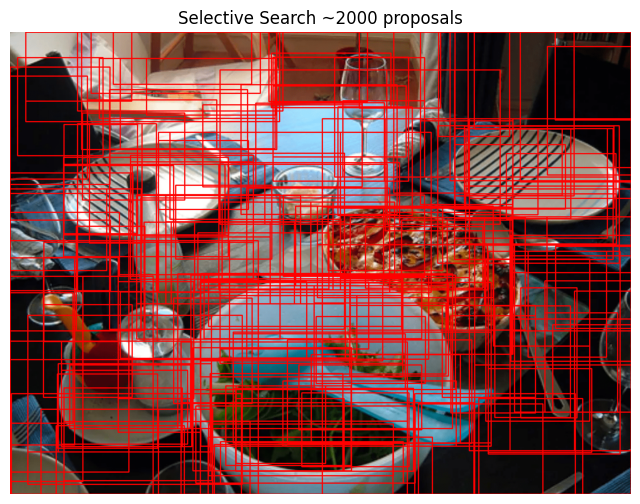

In [11]:
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

img = np.array(Image.open("table_sample-min.png").convert("RGB"))

boxes = selective_search_proposals(
    img_rgb=img,
    k_list=(50, 100, 150, 300),  # multi-scale FH
    min_size=50,
    use_texture=True,
    max_proposals=2000,
    per_scale_merge_cap=4000,    # or e.g. 4000 for speed
    nms_iou=0.7
)
print(f"Proposals: {len(boxes)}")

vis = draw_proposals(img, boxes, k=200, thickness=2)
plt.figure(figsize=(10,6))
plt.imshow(vis); plt.axis("off"); plt.title("Selective Search ~2000 proposals")
plt.show()

On a 1,500 x 1,200 input image, this took ~15 minutes to run. We can speed this up with the following ways:
1. Down scale the input image
2. Prune bounding boxes initially by ensuring they are a certain sane range of aspect ratios.
3. Reduce the number of segmentation hierarchies by reducing the number of k's
4. Use built in libraries in openCV `switchToSelectiveSearchFast()` that might have simpler region similarity calculations